In [1]:
import numpy as np
import sympy as sym
from sympy.abc import t
from sympy import Function, symbols, sin, cos, pi, Matrix, solve, lambdify, simplify, Eq
import matplotlib.pyplot as plt

##define variables
#configurations
xb, yb, tb = Function(r'x_box')(t), Function(r'y_box')(t), Function(r'theta_box')(t)
xj, yj, tj = Function(r'x_jack')(t), Function(r'y_jack')(t), Function(r'theta_jack')(t)
q = Matrix([xb,yb,tb,xj,yj,tj])
qdot = q.diff(t)
qddot = qdot.diff(t)

#box 
M, L = 1000, 20
#jack
m, l = 4, 4
#gravity
grav = 9.8

In [2]:
##Helper Functions

# transformation function, return g: 4x4 matrix 
def trans(theta,x,y):
    g = Matrix([[cos(theta),-sin(theta),0,x],[sin(theta),cos(theta),0,y],[0,0,1,0],[0,0,0,1]])
    return g

# unhat function
def unhat(V_hat):
    V = sym.Matrix([[V_hat[0,3]],[V_hat[1,3]],[V_hat[2,3]],[V_hat[2,1]],[V_hat[0,2]],[V_hat[1,0]]])
    return V

# inverse function
def inverse(g):
    R = Matrix([[g[0,0], g[0,1], g[0,2]],
                [g[1,0], g[1,1], g[1,2]],
                [g[2,0], g[2,1], g[2,2]]])

    p = Matrix([g[0,3], g[1,3], g[2,3]])
    
    P = -R.T * p
    g_inv = Matrix([
                [R.T[0,0], R.T[0,1], R.T[0,2], P[0]],
                [R.T[1,0], R.T[1,1], R.T[1,2], P[1]],
                [R.T[2,0], R.T[2,1], R.T[2,2], P[2]],
                [0, 0, 0, 1]
                ])
    return g_inv

#inertia function
def inertia(m,J):
    return Matrix([
                   [m,0,0,0,0,0],
                   [0,m,0,0,0,0],
                   [0,0,m,0,0,0],
                   [0,0,0,0,0,0],
                   [0,0,0,0,0,0],
                   [0,0,0,0,0,J]
                    ])
# find R: rotation matrix
def R_(theta):

    return Matrix([
                   [cos(theta), -sin(theta),0],
                   [sin(theta), cos(theta) ,0],
                   [0 ,0 ,1]
                  ])
# find T: transformation matrix
def T_(R,p):
  
    return Matrix([[R, p], [0 ,0 ,0 ,1]])

In [3]:
## Find Transformation Matrix

#### World to box 
gW_box = trans(tb,xb,yb)
# box to A
gbox_A = trans(0,-L/2,L/2)
# box to B
gbox_B = trans(0,L/2,L/2)
# box to C
gbox_C = trans(0,L/2,-L/2)
# box to D
gbox_D = trans(0,-L/2,-L/2)
## to Box Vertexes ABCD
gWA = gW_box * gbox_A
gWB = gW_box * gbox_B
gWC = gW_box * gbox_C
gWD = gW_box * gbox_D
##
# box to 1
gbox_1 = trans(0,0,L/2)
# box to 2
gbox_2 = trans(0,L/2,0)
# box to 3
gbox_3 = trans(0,0,-L/2)
# box to 4
gbox_4 = trans(0,-L/2,0)
## to Box Edges 1234
gW1 = gW_box * gbox_1
gW2 = gW_box * gbox_2
gW3 = gW_box * gbox_3
gW4 = gW_box * gbox_4
##
####

#### World to jack 
gW_jack = trans(tj,xj,yj)
#jack to a
gjack_a = trans(0,l/2,0)
# jack to b
gjack_b = trans(0,-l/2,0)
# jack to c
gjack_c = trans(0,0,l/2)
# jack to d
gjack_d = trans(0,0,-l/2)
## to jack points
gWa = gW_jack * gjack_a
gWb = gW_jack * gjack_b
gWc = gW_jack * gjack_c
gWd = gW_jack * gjack_d
##
####

#### When collision happens
# box to jack 
gbox_W = inverse(gW_box)
gbox_jack = gbox_W * gW_jack
# box edges "1234" to jack points "abcd"
g1_box = inverse(gbox_1)
g1_jack = g1_box * gbox_jack
g1a = g1_jack * gjack_a
g1b = g1_jack * gjack_b
g1c = g1_jack * gjack_c
g1d = g1_jack * gjack_d

g2_box = inverse(gbox_2)
g2_jack = g2_box * gbox_jack
g2a = g2_jack * gjack_a
g2b = g2_jack * gjack_b
g2c = g2_jack * gjack_c
g2d = g2_jack * gjack_d

g3_box = inverse(gbox_3)
g3_jack = g3_box * gbox_jack
g3a = g3_jack * gjack_a
g3b = g3_jack * gjack_b
g3c = g3_jack * gjack_c
g3d = g3_jack * gjack_d

g4_box = inverse(gbox_4)
g4_jack = g4_box * gbox_jack
g4a = g4_jack * gjack_a
g4b = g4_jack * gjack_b
g4c = g4_jack * gjack_c
g4d = g4_jack * gjack_d
####

In [4]:
## E-L without force and impact

###find KE
#find box velocity
Vb_hat = simplify(inverse(gW_box)*gW_box.diff(t))
Vb = unhat(Vb_hat)
#find jack velocity
Vj_hat = simplify(inverse(gW_jack)*gW_jack.diff(t))
Vj = unhat(Vj_hat)

#Find Inertia 
I_box = inertia(M, M*(L/2)**2)
I_jack = inertia(m, m*(l/2)**2)

KE = simplify(1/2 * (Vb.T) * I_box * Vb + 1/2 * (Vj.T) * I_jack * Vj)
###

#find PE, assume only jack has gravity 
PE = m*grav*yj

#Find Lagrangian without impact
L = KE[0]-PE
L_m = Matrix([L])
Ldq = simplify(L_m.jacobian(q).T)
Ldqdot = simplify(L_m.jacobian(qdot).T)
EL = Ldqdot.diff(t) - Ldq

In [5]:
### Impact Update 

# External Force or Torque
F = Matrix([50000*cos(pi*t),         #box_x
            0,                      #box_y
            50000*cos(pi*t),           #box_theta
            0,                      #jack_x
            0,                      #jack_y
            0])                     #jack_theta

# Define symbols for dummy variables
x_b,y_b,th_b = symbols(r'x_b, y_b, theta_b')
x_j,y_j,th_j = symbols(r'x_j, y_j, theta_j')
dx_b, dy_b, dth_b = symbols(r'\dot{x_b},\dot{y_b},\dot{th_b}')
dx_j, dy_j, dth_j = symbols(r'\dot{x_j},\dot{y_j},\dot{th_j}')
dx_b_pos, dy_b_pos, dth_b_pos = symbols(r'\dot{x_b}^+, \dot{y_b}^+, \dot{th_b}^+')
dx_j_pos, dy_j_pos, dth_j_pos = symbols(r'\dot{x_j}^+, \dot{y_j}^+, \dot{th_j}^+')
q_dum = {q[0]:x_b, q[1]:y_b, q[2]:th_b, q[3]:x_j, q[4]:y_j, q[5]:th_j, qdot[0]:dx_b, qdot[1]:dy_b, qdot[2]:dth_b, qdot[3]:dx_j, qdot[4]:dy_j, qdot[5]:dth_j}
q_dum_pos = {dx_b:dx_b_pos, dy_b:dy_b_pos, dth_b:dth_b_pos, dx_j:dx_j_pos, dy_j:dy_j_pos, dth_j:dth_j_pos}

lamb = symbols(r'\lambda')
q_pos = [dx_b_pos, dy_b_pos, dth_b_pos, dx_j_pos, dy_j_pos, dth_j_pos, lamb]

#### Find impact equations
## Find Hamiltonian
p = Ldqdot.T
H = Matrix(p * qdot) - L_m
H_dum = H.subs(q_dum)
H_pos = H_dum.subs(q_dum_pos)
##
Ldqdot_dum = Ldqdot.subs(q_dum)
Ldqdot_dum_pos = Ldqdot_dum.subs(q_dum_pos)
# E-L with external force
EL_with_F = simplify(Eq(EL,F))

sol = solve(EL_with_F, qddot, dict=True)
sols = simplify(sol[0])

## function Lambdification for qddot_dummy
#f(q):
f_qddot = Matrix([qdot[0],sols[qddot[0]],qdot[1],sols[qddot[1]],qdot[2],sols[qddot[2]],qdot[3],sols[qddot[3]],qdot[4],sols[qddot[4]],qdot[5],sols[qddot[5]]])
#lambdify(q, f(q))
lam_f_qddot = lambdify([[q[0],qdot[0],
                            q[1],qdot[1],
                            q[2],qdot[2],
                            q[3],qdot[3],
                            q[4],qdot[4],
                            q[5],qdot[5],
                            t]], f_qddot)
##

## function Lambdification for phi
#phi(q) list:
phi_list = [g1a[7],g1b[7],g1c[7],g1d[7],
            g2a[3],g2b[3],g2c[3],g2d[3],
            g3a[7],g3b[7],g3c[7],g3d[7],
            g4a[3],g4b[3],g4c[3],g4d[3]]
#q
q_in =[[q[0],qdot[0],q[1],qdot[1],q[2],qdot[2],q[3],qdot[3],q[4],qdot[4],q[5],qdot[5],t]]
#lambdify(q, phi(q)) list
lam_phi_list = []
for i in phi_list:
    lam_phi_list.append(lambdify(q_in,i))
##

impact_eqs = []
for phi_ in phi_list:
    phi = Matrix([phi_])
    dphidq = phi.jacobian(q).T
    dphidq_dum = dphidq.subs(q_dum)
    left = Matrix([Ldqdot_dum_pos - Ldqdot_dum, H_pos - H_dum])
    right = Matrix([lamb*dphidq_dum, 0])
    impact_eqs.append(Eq(left,right))
####
    
def impact_conditions_check(x,lam_phi_list,cons):
    i = 0 
    for phi_list in lam_phi_list:
        val = phi_list(x)
        if val < cons and val > -cons:
            return i
        i+=1  
    return -1

def impact_update(s,ieq):
    
    news = np.copy(s)
    # x = 1e-10
    V = {x_b:s[0],dx_b:s[1],y_b:s[2],dy_b :s[3],th_b:s[4],dth_b:s[5],x_j:s[6],dx_j:s[7],y_j:s[8],dy_j:s[9],th_j:s[10],dth_j:s[11]}
    impact = ieq.subs(V)
    impact_sols = solve(impact,q_pos,dict=True)
    for sol in impact_sols:
        lamd_sol = sol[lamb]
        if(abs(lamd_sol)<1e-10):   #set threshold for lambda
            pass
        else:
            news = [s[0],sol[q_pos[0]],s[2],sol[q_pos[1]],s[4],sol[q_pos[2]],s[6],sol[q_pos[3]],s[8],sol[q_pos[4]],s[10],sol[q_pos[5]],s[12]]
            return news
    return s
    


/home/jameszhz/.local/lib/python3.8/site-packages/sympy/matrices/repmatrix.py:98: SymPyDeprecationWarning: 

non-Expr objects in a Matrix has been deprecated since SymPy 1.9. Use
list of lists, TableForm or some other data structure instead. See
https://github.com/sympy/sympy/issues/21497 for more info.

  SymPyDeprecationWarning(


100%|██████████████████████████████████████| 2500/2500 [00:13<00:00, 190.81it/s]


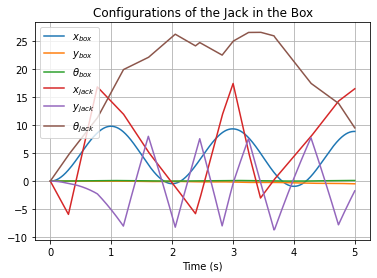

In [6]:
##Simulation 
from tqdm import tqdm

def integrate(f,x0,dt,time):
    k1=dt*(np.append(f(x0),time))
    k2=dt*(np.append(f(x0+k1/2.),time))
    k3=dt*(np.append(f(x0+k2/2.),time))
    k4=dt*(np.append(f(x0+k3),time))
    xnew=x0+(1/6.)*(k1+2.*k2+2.*k3+k4)
    xnew[-1] = time
    return xnew

def simulate(f,x0,tspan,dt,integrate):

    N = int((max(tspan)-min(tspan))/dt)
    x = np.copy(x0)
    tvec = np.linspace(min(tspan),max(tspan),N)
    xtraj = np.zeros((len(x0),N))
    time = 0
    for i in tqdm(range(N)):
        time = time+dt
        impact_condition = impact_conditions_check(x,lam_phi_list,0.05)
        if(impact_condition!=-1):
            x = impact_update(x,impact_eqs[impact_condition])
        xtraj[:,i]=integrate(f,x,dt,time)
        x = np.copy(xtraj[:,i]) 
    return xtraj  

import numpy as np
import math

def dyn(s):
    return np.array([lam_f_qddot(s)])


#initial condition
s0 = np.array([0, 0,      
               0, 0, 
               0, 0, 
               0, -20, 
               0, 0, 
               0, 5*pi, 
               -5]) 
dt = 0.002
tspan = [0,5]
N = int((max(tspan)-min(tspan))/dt)
times = np.linspace(min(tspan),max(tspan),N)
traj = simulate(dyn, s0, tspan, dt,integrate) 

#plot
# plt.figure(dpi=100)
plt.plot(times,traj[0])
plt.plot(times,traj[2])
plt.plot(times,traj[4])
plt.plot(times,traj[6])
plt.plot(times,traj[8])
plt.plot(times,traj[10])
plt.legend([r'$x_{box}$',r'$y_{box}$',r'$\theta_{box}$',r'$x_{jack}$',r'$y_{jack}$',r'$\theta_{jack}$'])
plt.xlabel('Time (s)')
plt.title('Configurations of the Jack in the Box')
plt.grid()
plt.show()

In [7]:
#animation code 
import IPython
def animate_Box_Jack(traj,T=5):
    """
    Function to generate web-based animation of Box-Jack system

    Parameters:
    ================================================
    traj:
        trajectory of theta1 and theta2, should be a NumPy array with
        shape of (2,N)
    T:
        length/seconds of animation duration

    Returns: None
    """
    ################################
    # Imports required for animation.
    from plotly.offline import init_notebook_mode, iplot
    from IPython.display import display, HTML
    import plotly.graph_objects as go
    #######################
    # Browser configuration.
    def configure_plotly_browser_state():
        display(IPython.core.display.HTML('''
            <script src="/static/components/requirejs/require.js"></script>
            <script>
              requirejs.config({
                paths: {
                  base: '/static/base',
                  plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
                },
              });
            </script>
            '''))
    configure_plotly_browser_state()
    init_notebook_mode(connected=False)
    
    
    ###############################################
    # Define arrays containing data for frame axes
    # In each frame, the x and y axis are always fixed
    N = len(traj[0]) 
    wj_x=np.zeros(N)
    wj_y=np.zeros(N)
    a_x=np.zeros(N)
    a_y=np.zeros(N)
    b_x=np.zeros(N)
    b_y=np.zeros(N)
    c_x=np.zeros(N)
    c_y =np.zeros(N)
    d_x =np.zeros(N)
    d_y =np.zeros(N)
    A_x=np.zeros(N)
    A_y=np.zeros(N)
    B_x=np.zeros(N)
    B_y=np.zeros(N)
    C_x=np.zeros(N)
    C_y =np.zeros(N)
    D_x =np.zeros(N)
    D_y =np.zeros(N)
  
    for i in range(N):
        gW_box  = T_(R_(traj[4,i]),Matrix([traj[0,i],traj[2,i],0]))
        gW_jack = T_(R_(traj[10,i]),Matrix([traj[6,i],traj[8,i],0]))
        gWa = gW_jack * gjack_a
        gWb = gW_jack * gjack_b
        gWc = gW_jack* gjack_c
        gWd = gW_jack * gjack_d
        gWA = gW_box * gbox_A
        gWB = gW_box * gbox_B
        gWC = gW_box * gbox_C
        gWD = gW_box * gbox_D
        wj_x[i] = gW_jack[3] 
        wj_y[i] = gW_jack[7] 
        a_x[i] = gWa[3] 
        a_y[i] = gWa[7]
        b_x[i] = gWb[3]
        b_y[i] = gWb[7]
        c_x[i] = gWc[3]
        c_y[i] = gWc[7]
        d_x[i] = gWd[3]
        d_y[i] = gWd[7]
        D_x[i] = gWD[3]
        D_y[i] = gWD[7]
        A_x[i] = gWA[3] 
        A_y[i] = gWA[7]
        C_x[i] = gWC[3]
        C_y[i] = gWC[7]
        B_x[i] = gWB[3]
        B_y[i] = gWB[7]
    
    ####################################
    # Using these to specify axis limits.
    xm = -15
    xM = 15
    ym = -15
    yM = 15
    
    ###########################
    # Defining data dictionary.
    # Trajectories are here.
    data=[dict(name="Jack"),dict(name="Box"),dict(name="Jack:a"),dict(name="Jack:b"),dict(name="Jack:c"),dict(name="Jack:d")
        ]
    
    ################################
    # Preparing simulation layout.
    # Title and axis ranges are here.
    layout=dict(xaxis=dict(range=[xm, xM], autorange=False, zeroline=False,dtick=1),
                yaxis=dict(range=[ym, yM], autorange=False, zeroline=False,scaleanchor = "x",dtick=1),
                title='Jack in the Box', 
                hovermode='closest',
                updatemenus= [{'type': 'buttons',
                               'buttons': [{'label': 'Play','method': 'animate',
                                            'args': [None, {'frame': {'duration': T, 'redraw': False}}]},
                                           {'args': [[None], {'frame': {'duration': T, 'redraw': False}, 'mode': 'immediate',
                                            'transition': {'duration': 0}}],'label': 'Pause','method': 'animate'}
                                          ]
                              }]
               )
    
    ########################################
    # Defining the frames of the simulation.
    # This is what draws the lines from
    # joint to joint of the system.
    frames=[dict(data=[dict(x=[a_x[k],
                               b_x[k],
                               wj_x[k] ,
                               c_x[k],
                               d_x[k]], 
                y=[a_y[k],
                   b_y[k],
                   wj_y[k],
                   c_y[k],
                   d_y[k]], 
                mode='lines',
                line=dict(color='purple', width=3)
                ),
                        dict(x=[
                               A_x[k],
                               B_x[k],
                               C_x[k],
                               D_x[k],
                               A_x[k]], 
                            y=[
                               A_y[k],
                               B_y[k],
                               C_y[k],
                               D_y[k],
                               A_y[k]
                              ], 
                            mode='lines',
                            line=dict(color='black', width=5)
                            ),
                  go.Scatter(
                            x=[a_x[k]],
                            y=[a_y[k]],
                            mode="markers",
                            marker=dict(color="red", size=10)),
                  go.Scatter(
                            x=[b_x[k]],
                            y=[b_y[k]],
                            mode="markers",
                            marker=dict(color="green", size=10)),
                  go.Scatter(
                            x=[c_x[k]],
                            y=[c_y[k]],
                            mode="markers",
                            marker=dict(color="blue", size=10)),
                  go.Scatter(
                            x=[d_x[k]],
                            y=[d_y[k]],
                            mode="markers",
                            marker=dict(color="orange", size=10)),
                ]) for k in range(N)]
    
    #######################################
    # Putting it all together and plotting.
    figure1=dict(data=data, layout=layout, frames=frames)           
    iplot(figure1)

##############
# Animate
animate_Box_Jack(np.array(traj),5)